<h1 align="center">The Discrete Fourier Transform & Filtering and Convolution.</h1>

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.io import wavfile
import IPython
import scipy as sp
import time
from scipy import signal
from scipy.misc import imread
%matplotlib inline
plt.rcParams['figure.figsize'] = [15,8]

## SoundWave Class

In [2]:
class SoundWave(object):
    """A SoundWave class for working with digital audio signals.
    Attributes:
        rate (int): The sample rate of the sound.
        samples ((n,) ndarray): NumPy array of samples.
    """

    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.
        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        Returns:
            A SoundWave object.
        """
        self.rate = rate
        self.samples = samples
        return
        raise NotImplementedError("Problem 1 Incomplete")
    
    def plot(self):
        """Plot and display the graph of the sound wave."""
        num_samples = len(self.samples) / self.rate
        domain = np.linspace(0,num_samples, len(self.samples))
        plt.plot(domain, self.samples)
        plt.show()
        return
        raise NotImplementedError("Problem 1 Incomplete")
        

    def export(self, filename):
        """Generate a wav file called filename from the sample rate and samples. 
        If the array of samples is not of type int16, scale it so that it is."""
        samplesDType = self.samples.dtype
        samples2 = np.copy(self.samples)
        maxSample = np.max(samples2)
        if (samplesDType != 'int16'):
            samples2 = samples2 * 32767 / maxSample
            samples2 = np.int16(samples2)
        wavfile.write(filename, self.rate, samples2)
        

    def __add__(self, other):
        """Add two sound waves together into one wave."""
        if len(self.samples) != len(other.samples):
            raise ValueError
            
        new_samples = self.samples + other.samples
        new_sound = SoundWave(44100, new_samples)
        return new_sound
        return IPython.display.Audio("ANote.wav")
        
        

    
    def append(self, other):
        """Append additional samples to the end of the current samples."""
        if self.rate != other.rate:
            raise ValueErrror
        new_samples = np.hstack((self.samples,other.samples))
        new_sound = SoundWave(44100, new_samples)
        return new_sound
        raise NotImplementedError("Problem 4 Incomplete")
        

    def plot_dft(self):
        """Take the DFT of the sound wave. Scale the x-axis so the x-values correspond
        to the frequencies present in the plot. Display the left half of the plot."""
        
        
        dft = abs(sp.fft(self.samples))
        N = dft.shape[0]
        x_vals = np.linspace(1, N, N)
        x_vals = x_vals * self.rate / N 
        plt.plot(x_vals[:N//2], dft[:N//2])
        plt.show()
        return
        
        


Write the `SoundWave` constructor.

Write the `plot()` method of the `SoundWave` class.

Plot the `tada.wav` file.

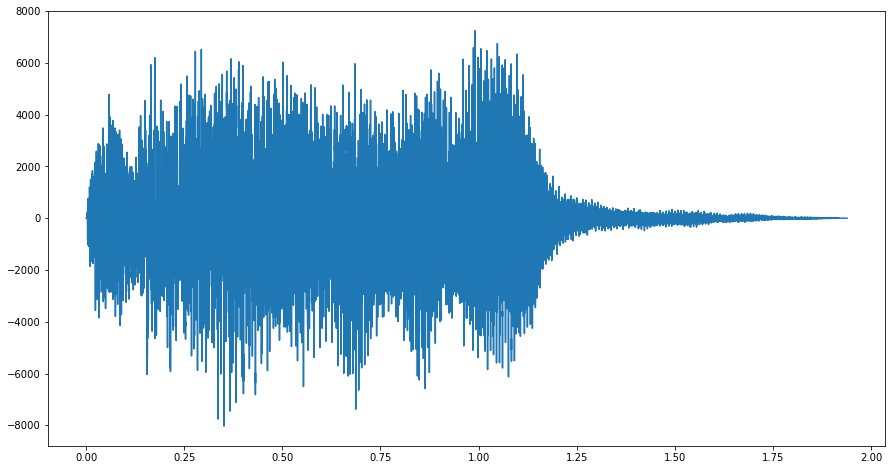

In [3]:
rate, wave = wavfile.read('tada.wav')
ballon = SoundWave(rate, wave)
ballon.plot()
IPython.display.Audio('tada.wav')


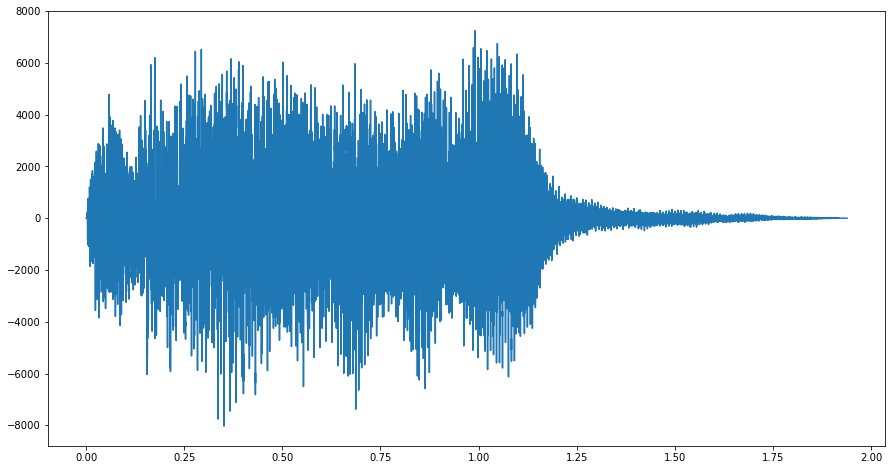

In [4]:
ballon.export('tada2.wav')
rate2, wave2 = wavfile.read('tada2.wav')
ballon2 = SoundWave(rate2, wave2)
ballon2.plot()
IPython.display.Audio('tada2.wav')

Write the `export()` method of the `SoundWave` class.

Display the original `tada.wav` sound.

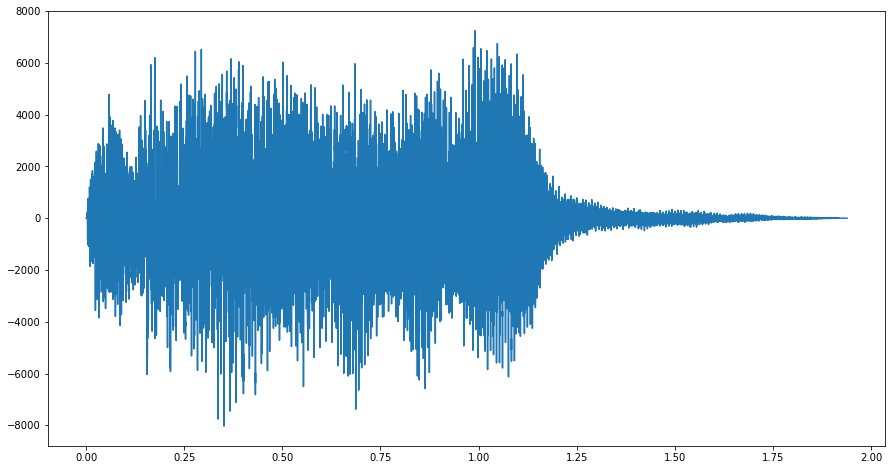

In [5]:
ballon.export('tada2.wav')
rate2, wave2 = wavfile.read('tada2.wav')
ballon2 = SoundWave(rate2, wave2)
ballon2.plot()
IPython.display.Audio('tada2.wav')

Use the export method to create a differently named file containing the same sound as `tada.wav`. Display this sound.

## Problem 3

In [6]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 samples per second.
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    wave_function = lambda x: np.sin(2*np.pi*x*frequency)
    sample_points = np.linspace(0, duration, int(44100*duration))
    samples = wave_function(sample_points)
    
    sound = SoundWave(44100, samples)
    
    return sound
    


Generate an 'A' note and display it.

In [7]:
A_note = generate_note(440, 2)
A_note.export("ANote.wav")
IPython.display.Audio("ANote.wav")

Write the `add()` magic method of the `SoundWave` class.

Generate a minor chord ('A', 'C', and 'E' notes) and display it.

In [8]:
A_note = generate_note(440, 2)
C_note = generate_note(523.25, 2)
E_note = generate_note(659.25, 2)


minor = A_note + C_note + E_note

minor.export("minor.wav")
IPython.display.Audio("minor.wav")

Write the `append()` method of the `SoundWave` class.

Generate and display a sound that changes over time.

In [9]:
A_note = generate_note(440, 2)
C_note = generate_note(523.25, 2)
E_note = generate_note(659.25, 2)

new_sound = A_note.append(C_note)

new_sound.export("athenC.wav")
IPython.display.Audio("athenC.wav")

In [10]:
def naive_DFT(samples):
    """Compute the DFT of the array of samples using the naive method.
    Parameters:
        samples ((n,) ndarray): NumPy array of samples.
    Returns:
        dft ((n,) ndarray): The DFT of the given array."""
    N = len(samples)
    c_k = []
    for i in range(0, N):
        val = 0
        for k in range(0, N):
            val = val + samples[k]*np.exp(-2*np.pi*1j * i * k / N)
        c_k.append(val)
        
    return c_k
            
    
 

Take the DFT of a small array of samples using your naive function and the SciPy method. Print the results of `np.allclose()` to verify that your function works.

In [11]:
samples = np.linspace(0,100, 10)
c_k1 = naive_DFT(samples)
c_k2 = sp.fft(samples)
np.allclose(c_k1, c_k2)

True

In [12]:
def FFT(samples):
    """Compute the DFT using the FFT algorithm.
    Parameters:
        samples ((n,) ndarray): NumPy array of samples.
    Returns:
        dft ((n,) ndarray): The DFT of the given array."""
    
    N = len(samples)
    if N == 1:
        return naive_DFT(samples)
    else:
        even = FFT(samples[::2])
        odd = FFT(samples[1::2])
        k = np.arange(N)
        factor = np.exp(-2*np.pi*1j*k/N)
        return np.concatenate((even + factor[:N//2] * odd, even + factor[N//2:] * odd))
    


Generate a small array of random samples (size must be a power of 2) and take its DFT using the FFT function you wrote and the SciPy method. Print the results of `np.allclose()` to verify that your function works.

In [13]:
samples = np.linspace(0,1024, 1024)
c_k1 = sp.fft(samples)
c_k2 = FFT(samples)
np.allclose(c_k1, c_k2)

True

Now, compare the runtimes of your `naive_DFT()`, your `FFT()` function, and the SciPy method on the same random sample. Print the results.

In [14]:
samples = np.linspace(0,1024, 1024)
start = time.time()
c_k1 = sp.fft(samples)
stop1 = time.time() - start
start = time.time()
c_k2 = FFT(samples)
stop2 = time.time() - start

print("Time for sp.fft is ", stop1)
print("Time for FFT is ", stop2)



Time for sp.fft is  0.00035190582275390625
Time for FFT is  0.08403301239013672


Write the `plot_dft()` method in the `SoundWave` class.

Display the plot of the DFT of the 'A' note.

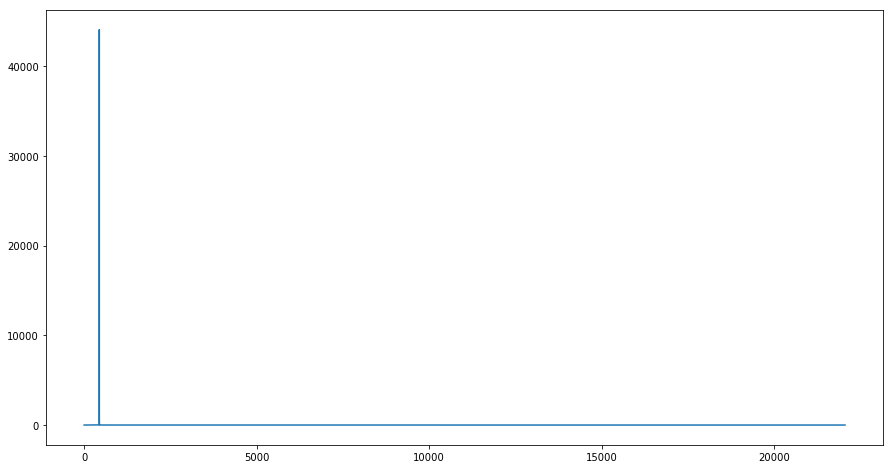

In [15]:
A_note = generate_note(440, 2)
A_note.plot_dft()




Display the plot of the DFT of the minor chord.

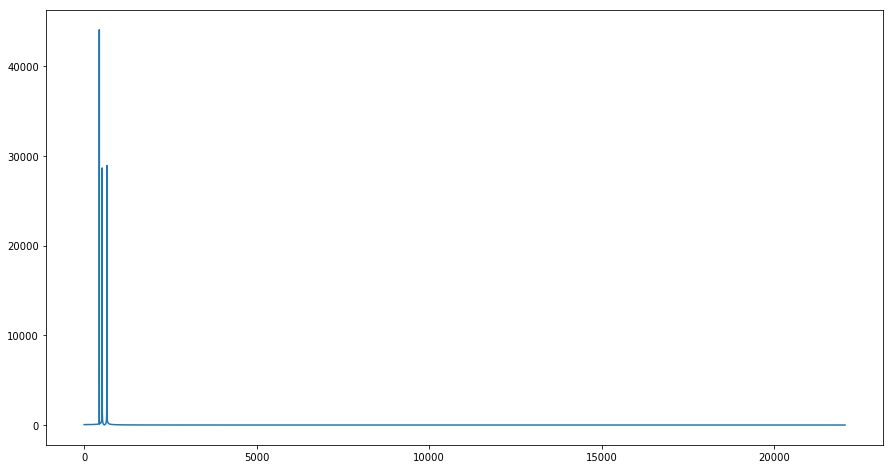

In [16]:
A_note = generate_note(440, 2)
C_note = generate_note(523.25, 2)
E_note = generate_note(659.25, 2)

minor = A_note + C_note + E_note
minor.plot_dft()

Use the information you have learned about the DFT to determine the notes present in the `mystery_sound.wav` file.

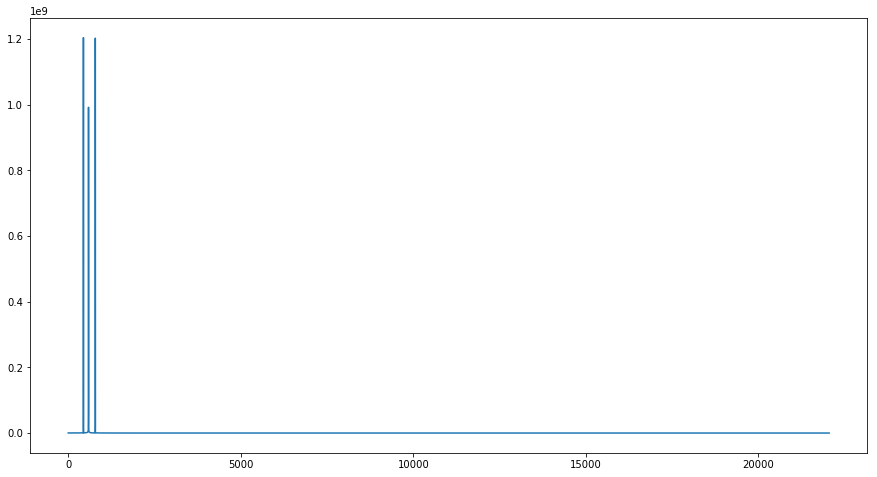

2200
3920
2937
[2200 3920 2937]
A 
G 
D 


In [17]:
rate, wave = wavfile.read('mystery_sound.wav')

mystery_sound = SoundWave(rate, wave)
mystery_sound.plot_dft()
c_k = abs(sp.fft(mystery_sound.samples))
c_k = c_k[:len(c_k)//2]

indicies = np.argsort(c_k)
indicies = indicies[::-1]

indicies = indicies[:3]

for j in indicies:
    if np.allclose(0, j%440) == True:
        print("A ")
    elif np.allclose(0, int(j%493.88)) == True:
        print("B ")
        
    elif np.allclose(0, int(j%523.25)) == True:
        print("C ")
    elif np.allclose(0, int(j%587.33)) == True:
        print("D ")
    elif np.allclose(0, int(j%659.25)) == True:
        print("E ")
    elif np.allclose(0, int(j%698.46)) == True:
        print("F ")
    elif np.allclose(0, int(j%783.99)) == True:
        print("G ")


A_note = generate_note(440, 2)
D_note = generate_note(587.33, 2)
G_note = generate_note(783.99, 2)

mystery = A_note + D_note + G_note

mystery.export("mystery_22.wav")
IPython.display.Audio("mystery_22.wav")

What are the notes present in the mystery sound?

A G D

    Note the DFT and FFT algorithms used in problem 5 and 6 were inspired by algorithms found at https://jakevdp.github.io/blog/2013/08/28/understanding-the-fft/.

# Filtering and Convolution

In [18]:
# Audio of tada.wav.
IPython.display.Audio("tada.wav")



Create a `SoundWave` object that is the circular convolution of `tada.wav` and two seconds of white noise. 

In [19]:


samplerate = 22050
noise = np.int16(np.random.randint(-32767, 32767, samplerate*2))
white_noise = SoundWave(samplerate, noise)
Fourier_white = sp.fft(noise)

tadaLength = len(ballon2.samples)
whiteLength = len(noise)
difference = whiteLength - tadaLength
arrayZeros = np.zeros(difference)
Fourier_tada = np.append(ballon2.samples, arrayZeros)
Fourier_tada = sp.fft(Fourier_tada)

new_noise = Fourier_tada * Fourier_white
new_noise = sp.ifft(new_noise)

new_noise = np.real(new_noise)
circular = SoundWave(samplerate, new_noise)

circular.export("circular.wav")
IPython.display.Audio("circular.wav")


1348
1348
44100 44100


Use the `append()` method in the `SoundWave` class to loop multiple copies of the signal consecutively. 

In [20]:
circular = circular.append(circular)
circular = circular.append(circular)

circular.export("circular.wav")
IPython.display.Audio("circular.wav")


In [21]:
# Audio of the AEA.wav
IPython.display.Audio('AEA.wav')

In [22]:
# Audio of EAE.wav
IPython.display.Audio('EAE.wav')

Write a function called `convolve_fft()` below that calculates the linear convolution using the FFT and IFFT. 

In [23]:
# Naive algorithm for a linear convolution. 
def naive_convolve(sample1,sample2):
    """Calculate the linear conovolution of sample1 and sample2 using the definition of convolution.

    Parameters:
        sample1 ((n,) ndarray): an array of length n representing the first sound sample. 
        sample2 ((m,) ndarray): an array of length m representing the second sound sample. 
    
    Return:
        ((n+m-1,) ndarray): an array of length n+m-1 representing the convolution of the two samples. 
    """
    sig1 = np.append(sample1, np.zeros(len(sample2)-1))
    sig2 = np.append(sample2, np.zeros(len(sample1)-1))

    final = np.zeros_like(sig1)
    rsig1 = sig1[::-1]
    for k in range(len(sig1)):
        final[k] = np.sum((np.append(rsig1[(k-1):],rsig1[:(k-1)]))*sig2)
    return final

# Linear Convolution using the Fourier Transforms
def convolve_fft(sample1,sample2):
    """Calculate the linear conovolution of sample1 and sample2 using the Convolution Theorem.

    Parameters:
        sample1 ((n,) ndarray): an array of length n representing the first sound samples. 
        sample2 ((m,) ndarray): an array of length m representing the second sound samples. 
    
    Return:
        ((n+m-1,) ndarray): an array of length n+m-1 representing the convolution of the two samples. 
    """
    sig1 = np.append(sample1, np.zeros(len(sample2)-1))
    sig2 = np.append(sample2, np.zeros(len(sample1)-1))
    total_length = len(sample1) + len(sample2) - 1
    fourier_sig1 = sp.fft(sig1)
    fourier_sig2 = sp.fft(sig2)
    new_sig = fourier_sig1 * fourier_sig2
    new_sig = sp.ifft(new_sig)
    return new_sig
    
    


Report the amount of time it takes to convolve samples of `AEA.wav` and `EAE.wav` with the function you have written `convolve_fft()`, `signal.convolve.fft()`, and `naive_convolve()`. 

In [24]:
rateAEA, waveAEA = wavfile.read('AEA.wav')
rateEAE, waveEAE = wavfile.read('EAE.wav')

AEA = SoundWave(rateAEA, waveAEA)
EAE = SoundWave(rateEAE, waveEAE)
start = time.time()
convolve_AEAEAE = np.real(convolve_fft(AEA.samples, EAE.samples))
stop = time.time()
convolveFftTime = stop - start
start = time.time()
np.real(naive_convolve(AEA.samples, EAE.samples))
stop = time.time()
naiveFftTime = stop - start
start = time.time()
scipyConvolve = sp.signal.fftconvolve(waveAEA, waveEAE)
stop = time.time()
scipyFftConvolveTime = stop - start

print("convolve_fft time is ", convolveFftTime, " naive_convolve time is ", naiveFftTime, " sp.signal.fftconvolve time is ", scipyFftConvolveTime)

convolve_fft time is  0.11415910720825195  naive_convolve time is  12.046224117279053  sp.signal.fftconvolve time is  0.005194902420043945


In [25]:
# Listen to the audio created by the convolve_fft() function.  

convolve_sound = SoundWave(rateAEA, convolve_AEAEAE)
convolve_sound.export("convolve.wav")
IPython.display.Audio("convolve.wav")



In [26]:
# Listen to the audio created by the sp.signal.fftconvolve() function. 



scipy_colvolve = SoundWave(rateAEA, scipyConvolve)
scipy_colvolve.export("scipyConvolve.wav")




IPython.display.Audio("scipyConvolve.wav")

In [27]:
# Audio of chopin.wav. 
IPython.display.Audio("chopin.wav")

In [28]:
# Audio of balloon.wav. 
IPython.display.Audio("balloon.wav")

Use the `signal.fftconvolve()` to convolve the signals of `balloon.wav` and `chopin.wav`.

In [29]:
ratePiano, wavePiano = wavfile.read("chopin.wav")
rateBalloon, waveBalloon = wavfile.read("balloon.wav")
convolve_pianoBalloon = sp.signal.fftconvolve(wavePiano, waveBalloon)
convolve_pianoBalloonSound = SoundWave(rateAEA, convolve_pianoBalloon)
convolve_pianoBalloonSound.export("convolvePianoBalloon.wav")
IPython.display.Audio("convolvePianoBalloon.wav")


Write a function that removes a range of frequencies in a signal.

In [30]:
def clean_signal(samples, rate, low_freq, high_freq):
    """Remove a range of frequencies from a sound sample using the Fourier Transform. 
    
    Parameters:
        samples ((n,) ndarray): Array of sound samples of length n. 
        rate (int): Sampling rate (the number of samples per second). 
        low_freq (float): Lower bound of the frequency range. 
        high_freq (float): Higher boound of the frequency range. 
    Returns:
        ((n,) ndarray): Array of the samples with the frequencies removed. 
    """
    low = low_freq*len(samples)//rate
    high = high_freq*len(samples)//rate
    samples = sp.fft(samples)
    samples[low:high]=0
    samples[-high:-low]=0
    return np.real(sp.ifft(samples))


In [31]:
# Audio of Noisysignal2.wav.
IPython.display.Audio("Noisysignal2.wav")

Plot the DFT of the Noisysignal2.wav to determine the frequencies with high amplitudes.

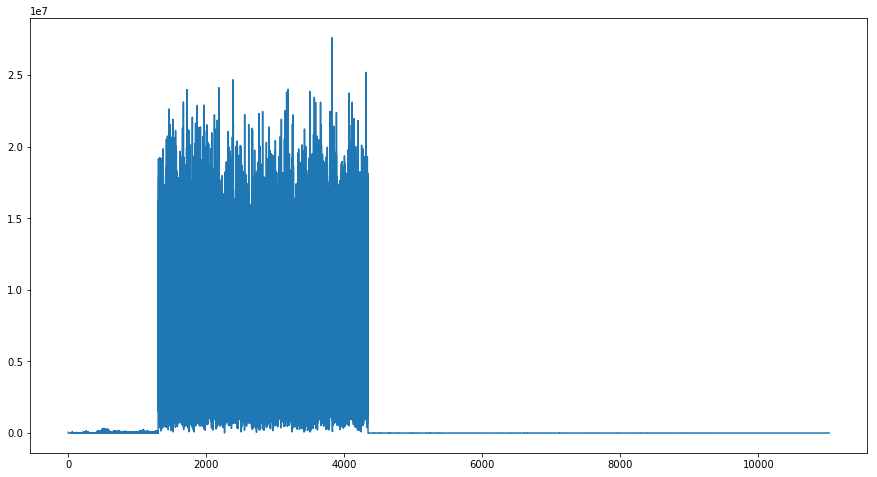

In [32]:
rateNoise, waveNoise = wavfile.read("Noisysignal2.wav")
noiseObject = SoundWave(rateNoise, waveNoise)
noiseObject.plot_dft()

Clean the signal by using the function you have written and make this signal a `SoundWave` object.

Listen to the signal to see if the noise has been filtered out.  

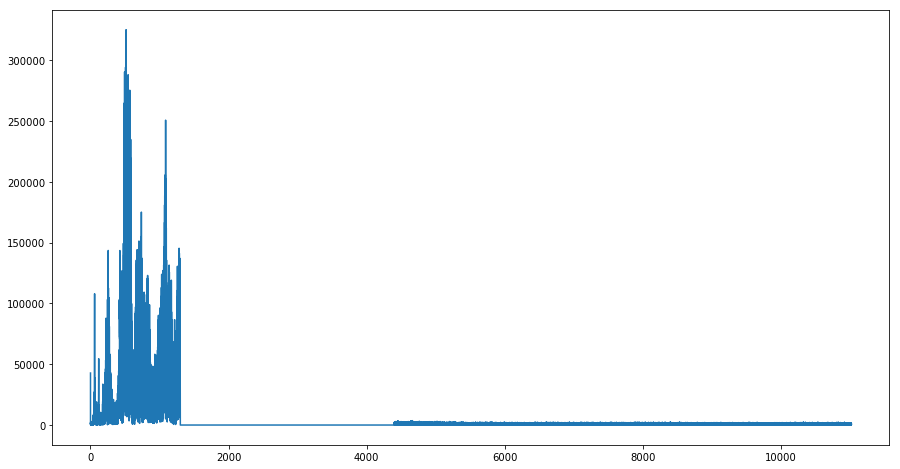

In [33]:
waveNoiseClean = clean_signal(waveNoise, rateNoise, 1300, 4400)

cleanWaveNoise = SoundWave(rateNoise, waveNoiseClean)
cleanWaveNoise.plot_dft()
cleanWaveNoise.export("CleanNoise.wav")
IPython.display.Audio("CleanNoise.wav")

In [35]:
# Original sound clip: vuvuzela.wav
IPython.display.Audio("vuvuzela.wav")

Filter out the vuvuzela noise in the `vuvuzela.wav` sound file by setting the coefficients at the frequencies 200-500 Hz to zero. 

In [36]:
rateWorldCup, waveWorldCup = wavfile.read("vuvuzela.wav")
worldCup = SoundWave(rateWorldCup, waveWorldCup)
waveWorldCup1 = waveWorldCup[:,0]
waveWorldCup2 = waveWorldCup[:,1]
waveWorldCup1Clean = clean_signal(waveWorldCup1, rateWorldCup, 200, 500)
waveWorldCup2Clean = clean_signal(waveWorldCup2, rateWorldCup, 200, 500)
waveWorldCupClean = np.vstack((waveWorldCup1Clean, waveWorldCup2Clean)).T
waveworldCupCleanSound = SoundWave(rateWorldCup, waveWorldCupClean)
waveworldCupCleanSound.export("vuvuzelaClean.wav")
IPython.display.Audio("vuvuzelaClean.wav")

Clean up the license plate image to determine the year printed on the sticker in the bottom right corner.

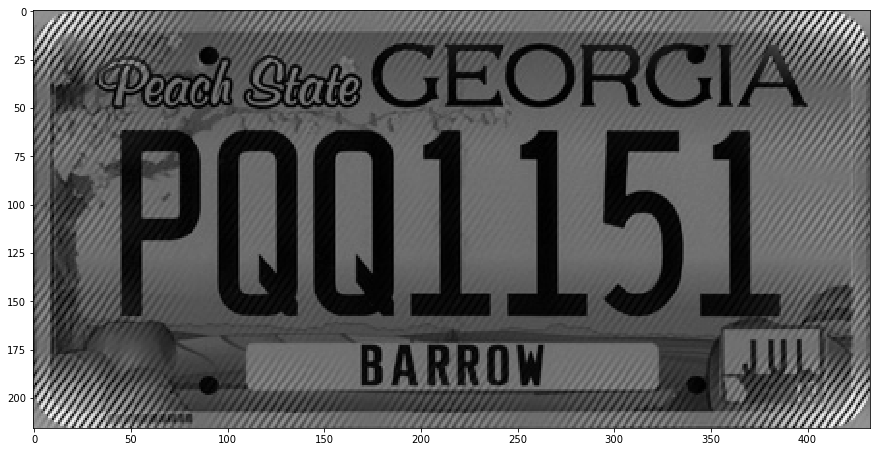

In [37]:
# Display the blurry image
image = imread("license_plate.png", True)
plt.imshow(image, cmap='gray')
plt.show()

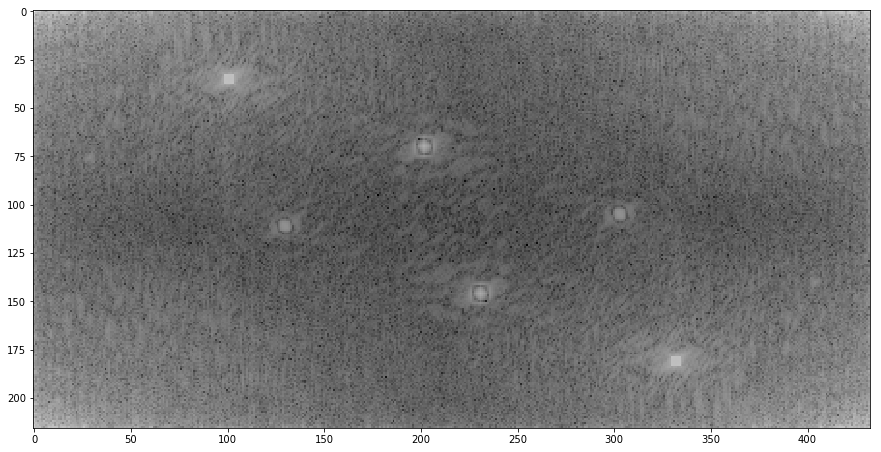

In [38]:
# Display the fft of the image
fft = np.fft.fft2(image)
plt.imshow(np.log(np.abs(fft)), cmap='gray')
plt.show()

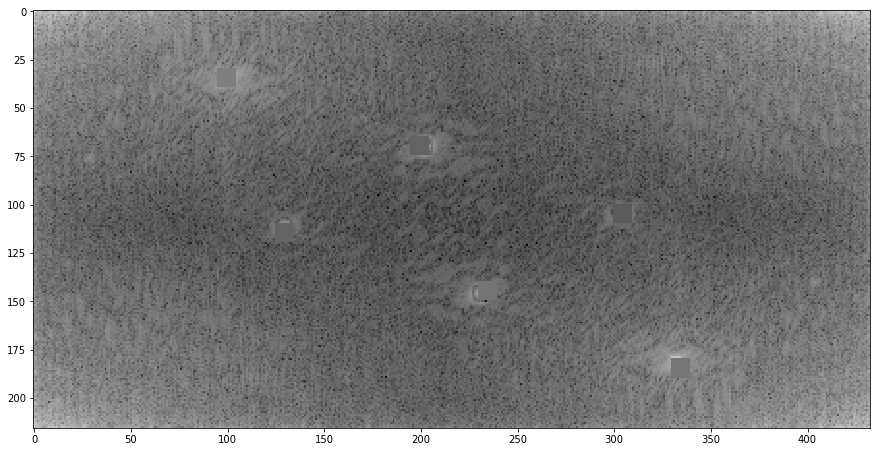

In [39]:
# Clean up the fft and display it
fft[30:40 ,95:105] = np.ones((10,10)) * fft[45][100]
fft[65:75, 195:205] = np.ones((10,10)) * fft[80][200]
fft[180:190, 330:340] = np.ones((10,10)) * fft[195][300]
fft[140:150, 230:240] = np.ones((10,10)) * fft[160][230]
fft[110:120, 125:135] = np.ones((10,10)) * fft[125][130]
fft[100:110, 300:310] = np.ones((10,10)) * fft[115][300]

plt.imshow(np.log(np.abs(fft)),cmap='gray')
plt.show()

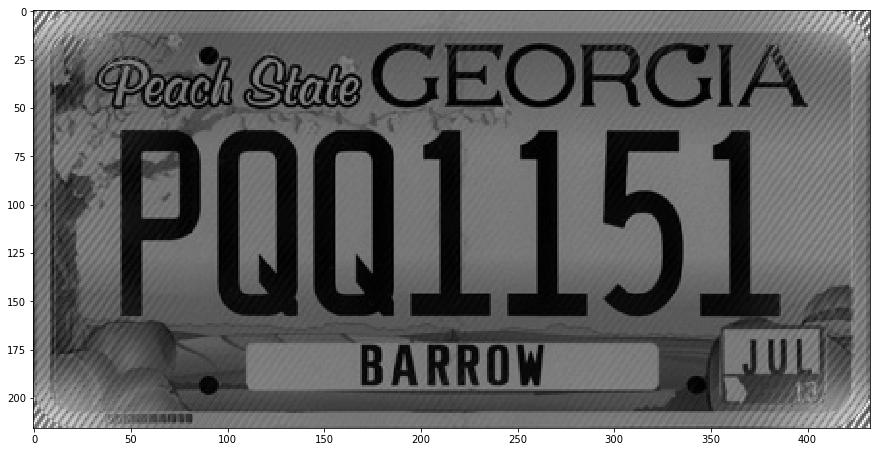

In [40]:
# Display the newly deblurred image

new_image = np.abs(np.fft.ifft2(fft))
plt.imshow(new_image, cmap='gray')
plt.show()

What is the year on the sticker?

13